In [ ]:
from model.unet import Unet
from model.training import *
from model.diffusionModel import DiffusionModel
from torch.utils.data import DataLoader
from torch.optim import Adam
from model.t5 import t5_encode_text
import torch.nn.functional as F
import torch
import matplotlib.pyplot as plt
import numpy as np

log_file='training_progress_humanart_digital_art.txt'
def show_msg(msg, file=log_file):
    if file is not None:
        with open(file, 'a') as f:
            f.write(msg+"\n")
    print(msg)

# training hyperparameters
batch_size = 2
n_epoch = 500
learning_rate = 1e-3
# network hyperparameters
device = torch.device("cuda:0" if torch.cuda.is_available() else 'cpu')
n_feat = 1024 # hidden dimension feature
max_text_len = 128 # word vector max size
height = 64 # 64x64 image
save_dir = './weights_dogs/'
# diffusion hyperparameters
timesteps = 100

dataset_data_path = './dataset/Flickr30k_dataset_dog.npy'
# load dataset
dataset = CustomDataset(dataset_data_path)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=1, drop_last=True)

df = DiffusionModel(timesteps, height)
model = Unet(in_channels=3, n_feat=n_feat, max_text_len=max_text_len, height=height, device=device).to(device)
#model.load_state_dict(torch.load(save_dir+"model_901.pth", map_location=device))
optimizer = Adam(model.parameters(), lr=learning_rate)
open(log_file, 'w').close()
list_total_loss = []
training_steps = 0
model.train()
for epoch in range(n_epoch):
    show_msg("------------------------------------ epoch {:03d} ({} steps) ------------------------------------".format(epoch + 1, training_steps))
    total_loss = 0
    loss_list = []
    # linearly decay of learning rate
    #optimizer.param_groups[0]['lr'] = learning_rate*(1-(epoch/n_epoch))
    for x_0, labels in dataloader:   # x_0: images
        optimizer.zero_grad()
        x_0 = x_0.to(device)
        # perturb data
        noise = torch.randn_like(x_0).to(device)
        t = torch.randint(1, timesteps + 1, (x_0.shape[0],)).to(device)
        x_t = df.noise_image(x_0, t, noise).to(device)
        t_emb, t_mask = t5_encode_text(labels)
        # use network to recover noise
        pred_noise = model(x_t, t/timesteps, t_emb=t_emb, t_mask=t_mask)

        # loss is measures the element-wise mean squared error between the predicted and true noise
        loss = F.mse_loss(pred_noise, noise)
        loss_list.append(loss.item())
        loss.backward()
        optimizer.step()
        training_steps+=1
        #if (training_steps%100) == 0:
            #print("Total train step: {}, Loss: {}".format(training_steps,loss))
            
    loss_list = np.array(loss_list)
    show_msg("Max loss: {}".format(loss_list.max()))
    show_msg("Min loss: {}".format(loss_list.min()))
    total_loss = loss_list.sum()
    show_msg("Mean loss: {}".format(loss_list.mean()))
    show_msg("Std loss: {}".format(loss_list.std()))
    show_msg("Total Loss: {}".format(total_loss))
    list_total_loss.append(total_loss)
  # save model periodically
    if epoch%100==0 or epoch == int(n_epoch-1):
        torch.save(model.state_dict(), save_dir + "model_{:03d}.pth".format(epoch+1))
        show_msg('saved model at ' + save_dir + "model_{:03d}.pth".format(epoch+1))
    
plt.figure()
plt.plot(list_total_loss)
plt.title("Total Loss vs Epoch")
plt.savefig('train.png')

show_msg("Fin del entrenamiento")

------------------------------------ epoch 001 (0 steps) ------------------------------------
Max loss: 1.0348000526428223
Min loss: 0.9814667701721191
Mean loss: 1.002751388436272
Std loss: 0.010181265959967423
Total Loss: 105.28889578580856
saved model at ./weights_dogs/model_001.pth
------------------------------------ epoch 002 (105 steps) ------------------------------------
Max loss: 1.0247747898101807
Min loss: 0.976320743560791
Mean loss: 0.9994513727369763
Std loss: 0.009574492053463037
Total Loss: 104.94239413738251
------------------------------------ epoch 003 (210 steps) ------------------------------------
Max loss: 1.0288190841674805
Min loss: 0.9795010089874268
Mean loss: 1.0010492784636362
Std loss: 0.008397907723782285
Total Loss: 105.1101742386818
------------------------------------ epoch 004 (315 steps) ------------------------------------
Max loss: 1.0222079753875732
Min loss: 0.9801791906356812
Mean loss: 0.9998689350627717
Std loss: 0.008822684274484087
Total Lo

/home/jupyter-tfg2324dm/.conda/envs/envDM/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Timestep 5000
EPS -> Mean: -0.0006273797480389476, std: 0.9990913271903992
SAMPLES -> Mean: 0.0020087657030671835, std: 1.0050686597824097
Timestep 4750
EPS -> Mean: -0.00156827038154006, std: 0.9991492629051208
SAMPLES -> Mean: 0.0056301592849195, std: 1.0063648223876953
Timestep 4500
EPS -> Mean: -0.004079651087522507, std: 0.9999101161956787
SAMPLES -> Mean: 0.006868037395179272, std: 1.002379059791565
Timestep 4250
EPS -> Mean: -0.00486263632774353, std: 1.0010576248168945
SAMPLES -> Mean: 0.011147303506731987, std: 0.9960501194000244
Timestep 4000
EPS -> Mean: -0.004940720275044441, std: 1.0004416704177856
SAMPLES -> Mean: 0.015866173431277275, std: 0.9858912229537964
Timestep 3750
EPS -> Mean: -0.006475236266851425, std: 1.0017918348312378
SAMPLES -> Mean: 0.020149219781160355, std: 0.9723785519599915
Timestep 3500
EPS -> Mean: -0.0060387286357581615, std: 1.0027263164520264
SAMPLES -> Mean: 0.02710164710879326, std: 0.9568474292755127
Timestep 3250
EPS -> Mean: -0.00417291279882

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

EPS -> Mean: 0.00554221635684371, std: 0.5758957266807556
SAMPLES -> Mean: 0.08192943781614304, std: 0.2706531584262848
Timestep 1
EPS -> Mean: 0.0064904759638011456, std: 0.5845352411270142
SAMPLES -> Mean: 0.08188759535551071, std: 0.2699253261089325


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

tensor([[[ 0.1044, -0.0397,  0.0333,  ...,  0.3813,  0.3454,  0.2749],
         [ 0.0526, -0.0401, -0.0452,  ...,  0.2261,  0.2859,  0.3651],
         [ 0.0303,  0.0100,  0.0068,  ...,  0.3271,  0.2730,  0.3055],
         ...,
         [-0.0525, -0.1720, -0.2961,  ...,  0.0923,  0.0624,  0.0861],
         [-0.1822, -0.3013, -0.4367,  ...,  0.1404,  0.0636,  0.0916],
         [-0.3601, -0.1998, -0.1389,  ...,  0.2111,  0.1535,  0.1413]],

        [[ 0.0375,  0.0682,  0.0729,  ...,  0.4885,  0.3805,  0.4447],
         [ 0.0793,  0.1118,  0.0920,  ...,  0.3706,  0.3986,  0.4387],
         [ 0.0840,  0.1248,  0.1277,  ...,  0.4087,  0.3793,  0.3696],
         ...,
         [-0.0731, -0.1264, -0.1924,  ...,  0.1503,  0.1092,  0.1983],
         [-0.1677, -0.2165, -0.3112,  ...,  0.1018,  0.0558,  0.1783],
         [-0.2282, -0.1704, -0.0543,  ...,  0.1990,  0.1617,  0.2291]],

        [[ 0.1658,  0.2250,  0.2139,  ...,  0.5642,  0.5455,  0.3869],
         [ 0.3806,  0.2577,  0.2784,  ...,  0

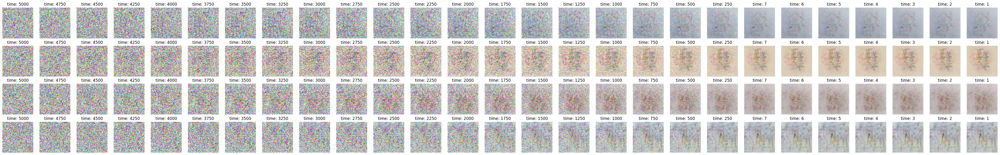

In [1]:
from model.diffusionModel import DiffusionModel
from model.unet import Unet
import matplotlib.pyplot as plt
import torch


# network hyperparameters
batch_size = 4
device = torch.device("cuda:0" if torch.cuda.is_available() else 'cpu')
n_feat = 512 # hidden dimension feature
max_text_len = 64 # word vector
height = 64 # 64x64 image
save_dir = './weights_humanart/'
# diffusion hyperparameters
timesteps = 5000

df = DiffusionModel(timesteps, height)
model = Unet(in_channels=3, n_feat=n_feat, max_text_len=max_text_len, height=height, device=device).to(device)
model.load_state_dict(torch.load(save_dir+"model_750.pth", map_location=device))

model.eval()
#model.train()

a = ('kids_drawing, a drawing of a mother and daughter holding hands',
     'kids_drawing, illustration of a boy with arms outstretched',
     'kids_drawing, a cartoon girl singing into a microphone',
     'kids_drawing, a drawing of children playing in the park')

samples = df.sample_ddpm_context(model, 4, a,save_rate=timesteps//20)
df.draw_samples_process(path='./generated_images/')
print(samples[0])
"""
samples = samples.detach().cpu().numpy()
for i, img in enumerate(samples):
    plt.subplot(1, 4, i + 1)
    plt.axis('off')
    img = df.unorm(img)
    plt.imshow(img.permute(1,2,0))
"""

print('Imagenes generadas')

In [1]:
from model.unet import Unet
from model.training import *
from model.diffusionModel import DiffusionModel
from torch.utils.data import DataLoader
from torch.optim import Adam
from model.t5 import t5_encode_text
import torch.nn.functional as F
import torch
import matplotlib.pyplot as plt
import numpy as np

log_file='training_progress_humanart.txt'
def show_msg(msg, file=log_file):
    if file is not None:
        with open(file, 'a') as f:
            f.write(msg+"\n")
    print(msg)

# training hyperparameters
batch_size = 32
n_epoch = 256
learning_rate = 1e-3
# network hyperparameters
device = torch.device("cuda:0" if torch.cuda.is_available() else 'cpu')
n_feat = 256 # hidden dimension feature
max_text_len = 512 # word vector max size
height = 64 # 64x64 image
save_dir = './weights_humanart/'
# diffusion hyperparameters
timesteps = 6000

dataset_data_path = './dataset/Flickr30k_dataset_dogs.npy'
# load dataset
dataset = CustomDataset(dataset_data_path)
dataloader = DataLoader(dataset, batch_size=len(dataset), shuffle=True, num_workers=1, drop_last=True)
for imgs, labels in dataloader:
    print(imgs.mean())
    print(imgs.std())

/home/jupyter-tfg2324dm/.conda/envs/envDM/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


tensor(0.4579)
tensor(0.2430)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

tensor([[[-2.5721e+20, -1.0503e+20, -1.6233e+20,  ...,  6.6152e+20,
           4.6312e+20,  1.1723e+21],
         [ 9.7363e+19, -2.8714e+20,  2.2465e+20,  ..., -2.8270e+21,
           9.8349e+20, -2.2944e+21],
         [ 6.2670e+19, -9.4847e+19,  1.0324e+20,  ...,  3.0453e+21,
          -1.1421e+20,  2.1019e+21],
         ...,
         [-2.2089e+20, -3.9378e+20,  3.1172e+20,  ...,  6.1793e+19,
          -2.8367e+20, -9.8646e+19],
         [-6.1244e+20, -3.7436e+20,  4.0752e+19,  ...,  2.9077e+20,
           2.3426e+20,  4.3215e+20],
         [-5.0296e+20, -4.6863e+20,  2.0603e+20,  ..., -2.2296e+20,
           8.5057e+19, -3.0193e+20]],

        [[ 7.6284e+19, -3.4045e+20,  1.3658e+20,  ..., -1.9043e+21,
          -1.3791e+20,  2.6385e+20],
         [ 1.9430e+20,  1.9902e+20,  1.7546e+20,  ...,  3.7217e+21,
           2.4760e+21, -2.9913e+20],
         [ 4.6217e+19,  1.1668e+20,  4.3380e+20,  ..., -2.2739e+21,
          -1.3331e+21, -6.4983e+20],
         ...,
         [ 3.7363e+20,  1

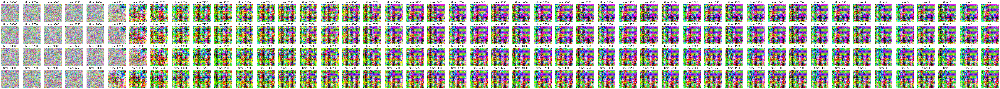

In [2]:
from model.diffusionModel import DiffusionModel
from model.unet import Unet
import matplotlib.pyplot as plt
import torch


# network hyperparameters
batch_size = 4
device = torch.device("cuda:0" if torch.cuda.is_available() else 'cpu')
n_feat = 1024 # hidden dimension feature
max_text_len = 512 # word vector
height = 64 # 64x64 image
save_dir = './weights_humanart_kids_drawing/'
# diffusion hyperparameters
timesteps = 10000

df = DiffusionModel(timesteps, height)
model = Unet(in_channels=3, n_feat=n_feat, max_text_len=max_text_len, height=height, device=device).to(device)
model.load_state_dict(torch.load(save_dir+"model_100.pth", map_location=device))

model.eval()
#model.train()

"""a = ('sketch, sketches of a man in a military uniform',
     'sketch, two people hugging and one holding a child')"""
"""a = ('kids_drawing, a cartoon girl singing into a microphone',
     'sketch, how to draw a man riding a bicycle',
     'stained_glass, a stained glass image of a woman holding a baby',
     'watercolor, a drawing of a nude woman sitting on a pillow',
     'oil_painting, a painting of a nude man surrounded by other men',
     'shadow_play, a green and black dress',
     'digital_art, a woman in a traditional japanese kimono standing in front of fire ',
     'ukiyoe, a black and white drawing of a woman sitting on a boat',
     'ink_painting, a painting of a woman in blue and white',
     'cartoon, a cartoon character with orange hair and black clothes')"""
a = ('kids_drawing, a cartoon guys singing into a microphone',
     'kids_drawing, a cartoon girl singing into a microphone',
     'kids_drawing, a painting of a man and animals on a hill',
     'kids_drawing, cartoon boy and girl holding hands stock vector')

samples = df.sample_ddpm_context(model, 4, a,save_rate=250)
df.draw_samples_process(path='./generated_images/')
print(samples[0])
"""
samples = samples.detach().cpu().numpy()
for i, img in enumerate(samples):
    plt.subplot(1, 4, i + 1)
    plt.axis('off')
    img = df.unorm(img)
    plt.imshow(img.permute(1,2,0))
"""

print('Imagenes generadas')

torch.randn(1, 512, 128)

In [ ]:
from model.t5 import t5_encode_text
from torch import nn

In [ ]:
m = nn.GELU()
input = torch.randn(2)
output = m(input)
input,output

In [ ]:
torch.aminmax(t5_encode_text("Two young girls are smiling and laughing .")[0])